In [1]:
%matplotlib inline

## numpy e scipy

Le immagini solo semplicemente array di numpy.

Lavorano naturalmente con immagini multidimensionali (TAC, risonanza magnetica, etc)

useremo:

* Numpy
* Scipy
* Scikits.image

In [2]:
import skimage
import scipy.ndimage as ndimage
import numpy as np
import pylab as plt

In [150]:
plt.rcParams['image.cmap'] = 'viridis'
noframe = dict(subplot_kw={'frame_on':False, 
                           'xticks':[], 
                           'yticks':[]})

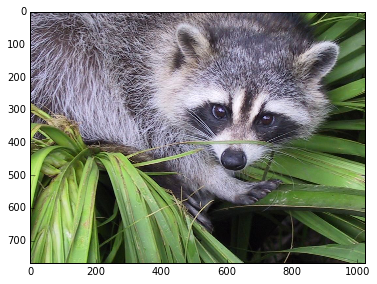

In [366]:
from scipy import misc
face = misc.face()
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.imshow(face)

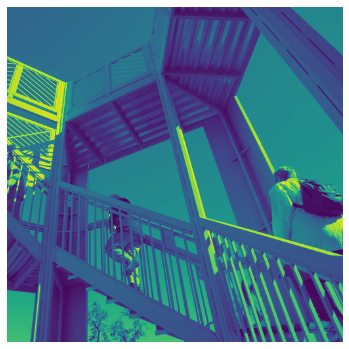

In [367]:
ascent = misc.ascent()
ascent = ascent/255
fig, ax = plt.subplots(1, 1,
                       figsize=(6, 6),
                       **noframe)
ax.imshow(ascent)

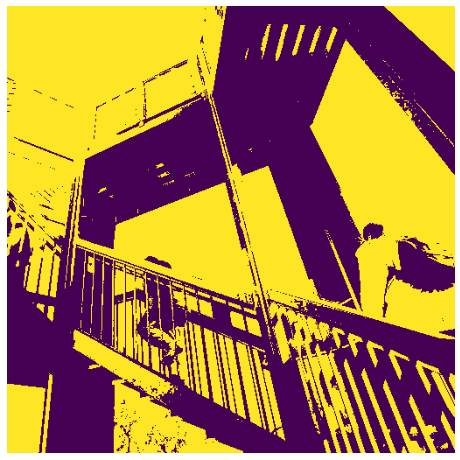

In [161]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8), **noframe)
ax.imshow(ascent>0.3)

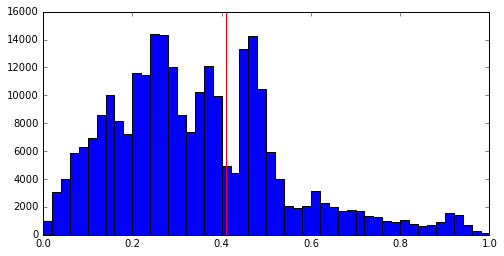

In [218]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
_, _, patch = ax.hist(ascent.ravel(),
                      bins=plt.linspace(0, 1, 51));
ax.axvline(0.41, color='r')

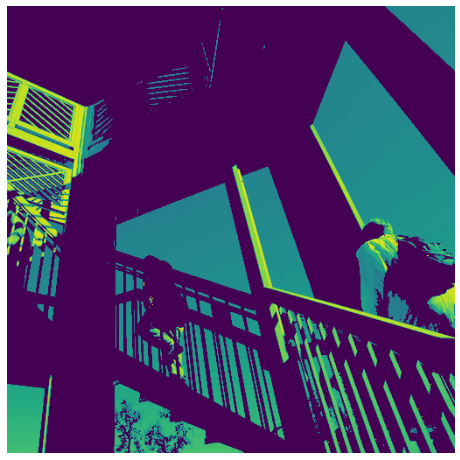

In [163]:
ascent_ = ascent.copy()
ascent_[ascent<0.41] = 0

ascent_ = np.where(ascent>0.41, ascent, 0)

fig, ax = plt.subplots(1, 1, figsize=(8, 8), **noframe)
ax.imshow(ascent_)

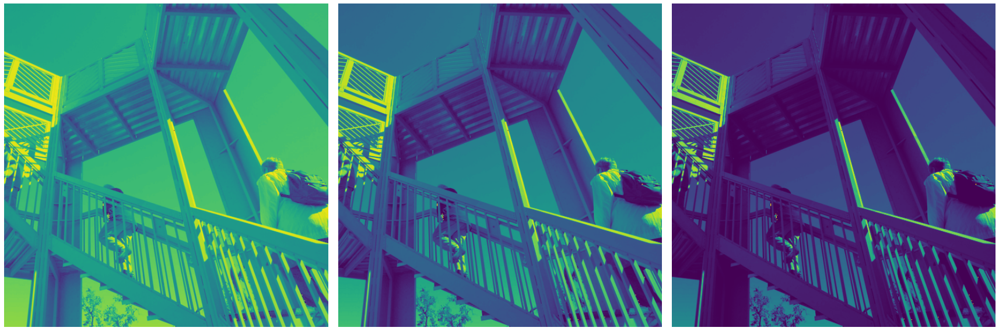

In [106]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, 
                                    figsize=(24, 8),
                                    **noframe)
ax1.imshow(ascent**0.5)
ax2.imshow(ascent)
ax3.imshow(ascent**2)
fig.tight_layout()

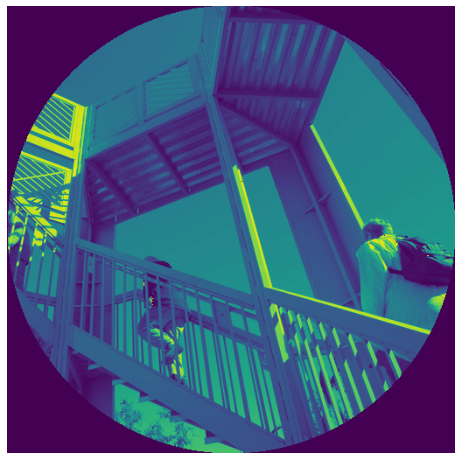

In [219]:
lx, ly = ascent.shape
X, Y = np.ogrid[0:lx, 0:ly]
mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4
ascent_ = ascent.copy()
ascent_[mask] = 0
fig, ax = plt.subplots(1, 1, figsize=(8, 8), **noframe)
ax.imshow(ascent_)

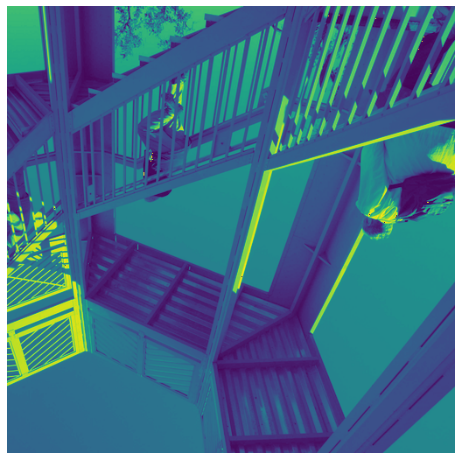

In [220]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8), **noframe)
ascent_ = np.flipud(ascent)
ax.imshow(ascent_)

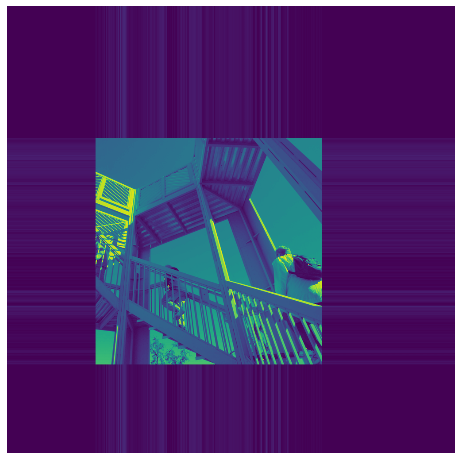

In [226]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8), **noframe)
ascent_ = np.pad(ascent, ((300, 200), (200, 300)), 'minimum')
ax.imshow(ascent_)

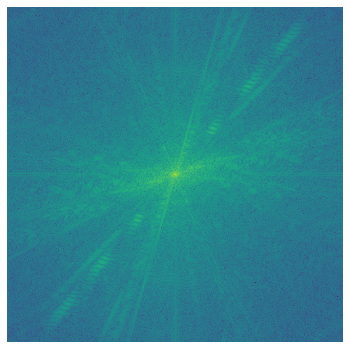

In [250]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6), **noframe)

trasform = np.fft.fft2(ascent)
F2 = np.fft.fftshift(trasform)
psd2D = np.abs( F2 )**2
ax.imshow(np.log10(psd2D))

# scipy.ndimage

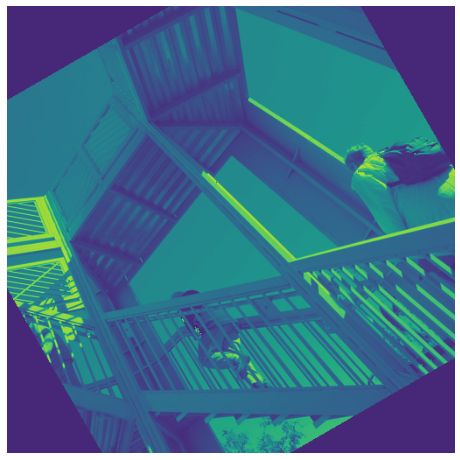

In [228]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8), **noframe)
ascent_ = ndimage.rotate(ascent, 30, reshape=False)
ax.imshow(ascent_)

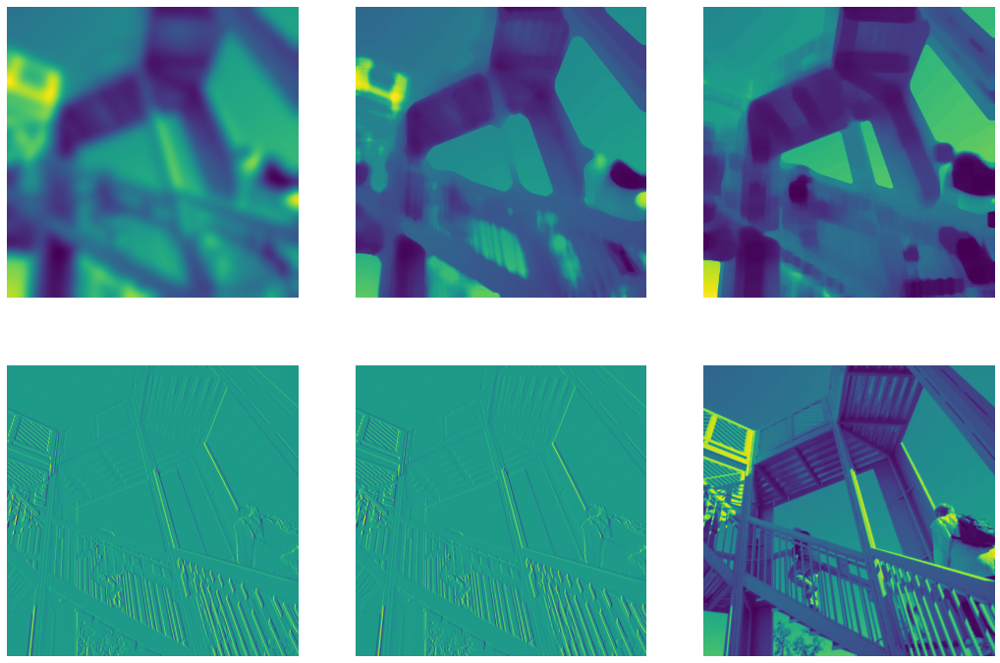

In [259]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(18, 12), **noframe)
ax1.imshow(ndimage.gaussian_filter(ascent, sigma=10))
ax2.imshow(ndimage.median_filter(ascent, size=30))
ax3.imshow(ndimage.percentile_filter(ascent, percentile=10, size=30))

ax4.imshow(ndimage.prewitt(ascent))
ax5.imshow(ndimage.prewitt(ascent))

k = np.array([[1,1,1],[1,1,0],[1,0,0]])
ax6.imshow(ndimage.convolve(ascent, k), mode='constant', cval=0.0)

(2.0, 1.5)


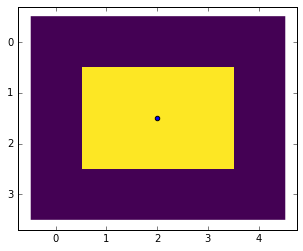

In [267]:
a = np.array(([0,0,0,0],
              [0,1,1,0],
              [0,1,1,0],
              [0,1,1,0],
              [0,0,0,0]))

center = ndimage.measurements.center_of_mass(a)
print(center)
plt.imshow(a.T, interpolation='nearest')
plt.scatter(*center)

In [269]:
a=  np.array([[2, 2, 2, 0, 0, 3],
              [2, 2, 2, 0, 0, 0],
              [0, 0, 1, 1, 0, 0],
              [0, 0, 1, 1, 0, 0],
              [0, 0, 0, 0, 1, 0],
              [0, 0, 0, 0, 0, 0]])

print(ndimage.find_objects(a, max_label=2))

print(a[ndimage.find_objects(a)[0]])

[(slice(2, 5, None), slice(2, 5, None)), (slice(0, 2, None), slice(0, 3, None))]
[[1 1 0]
 [1 1 0]
 [0 0 1]]


4


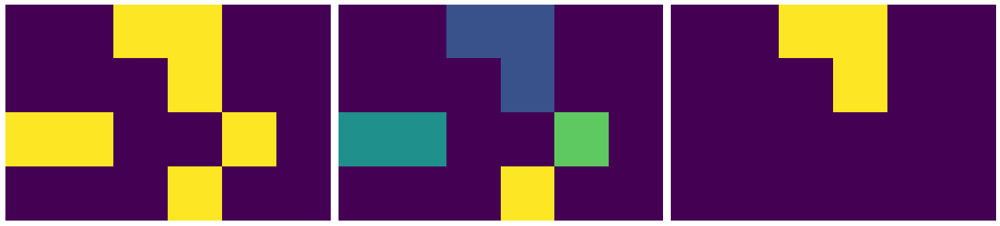

In [274]:
a = np.array([[0,0,1,1,0,0],
              [0,0,0,1,0,0],
              [1,1,0,0,1,0],
              [0,0,0,1,0,0]])

labeled_array, num_features = ndimage.label(a)
print(num_features)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6), **noframe)
ax1.imshow(a, interpolation='nearest')
ax2.imshow(labeled_array, interpolation='nearest')
ax3.imshow(labeled_array==1, interpolation='nearest')
fig.tight_layout()

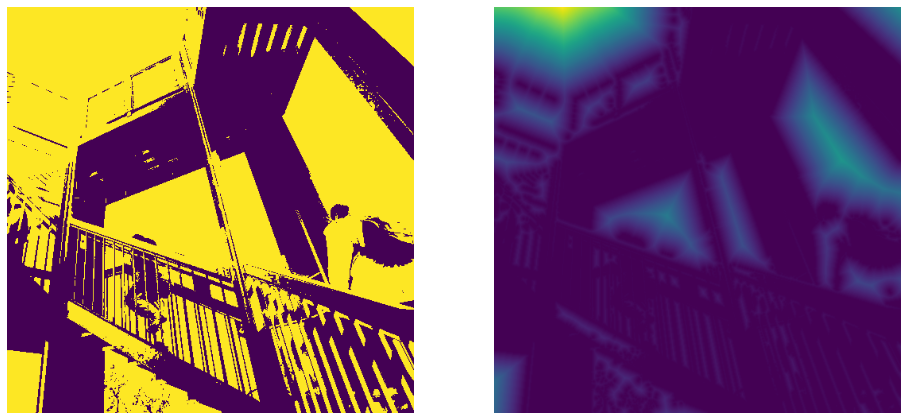

In [281]:
ascent_ = (ascent>0.3).astype(float)
ascent_2 = ndimage.distance_transform_edt(ascent_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), **noframe)
ax1.imshow(ascent_)
ax2.imshow(ascent_2)

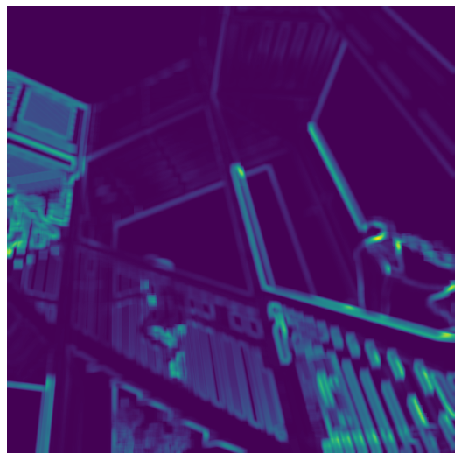

In [278]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8), **noframe)

win_mean = ndimage.uniform_filter(ascent, (10, 10))
win_sqr_mean = ndimage.uniform_filter(ascent**2, (10, 10))
win_var = win_sqr_mean - win_mean**2

ax.imshow(win_var, interpolation='nearest')

# Scikits.image

libreria costruita sopra scipy, come scikits.learn, cresciuta e separatasi come libreria indipendente

### moduli

* **color**: Color space conversion.
* **data**: Test images and example data.
* **draw**: Drawing primitives (lines, text, etc.) that operate on NumPy arrays.
* **exposure**: Image intensity adjustment, e.g., histogram equalization, etc.
* **feature**: Feature detection and extraction, e.g., texture analysis corners, etc.
* **filters**: Sharpening, edge finding, rank filters, thresholding, etc.
* **graph**: Graph-theoretic operations, e.g., shortest paths.
* **io**: Reading, saving, and displaying images and video.
* **measure**: Measurement of image properties, e.g., similarity and contours.
* **morphology**: Morphological operations, e.g., opening or skeletonization.
* **novice**: Simplified interface for teaching purposes.
* **restoration**: Restoration algorithms, e.g., deconvolution algorithms, denoising, etc.
* **segmentation**: Partitioning an image into multiple regions.
* **transform**: Geometric and other transforms, e.g., rotation or the Radon transform.
* **util**: Generic utilities.
* **viewer**: A simple graphical user interface for visualizing results and exploring parameters. 

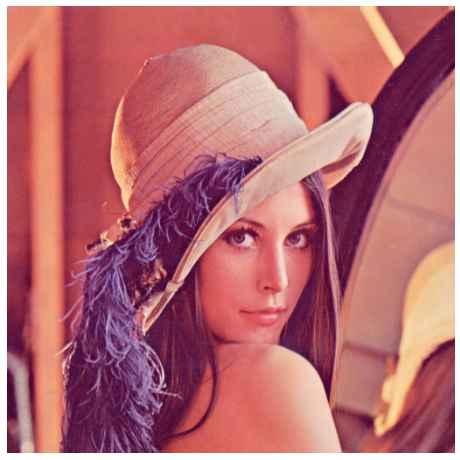

In [321]:
from skimage import io

lena = io.imread('http://www.ece.rice.edu/~wakin/images/lena512color.tiff')
fig, ax = plt.subplots(1, 1, figsize=(8, 8), **noframe)
ax.imshow(lena)

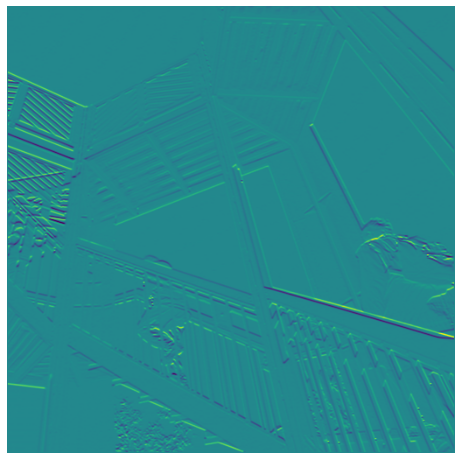

In [107]:
from skimage import filters

fig, ax = plt.subplots(1, 1, figsize=(8, 8), **noframe)
ax.imshow(skimage.filters.sobel_h(ascent))

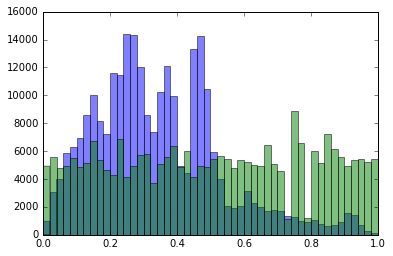

In [374]:
plt.hist(ascent.ravel(), bins=50,
         alpha=0.5);
plt.hist(exposure.equalize_hist(ascent).ravel(),
         bins=50, alpha=0.5);

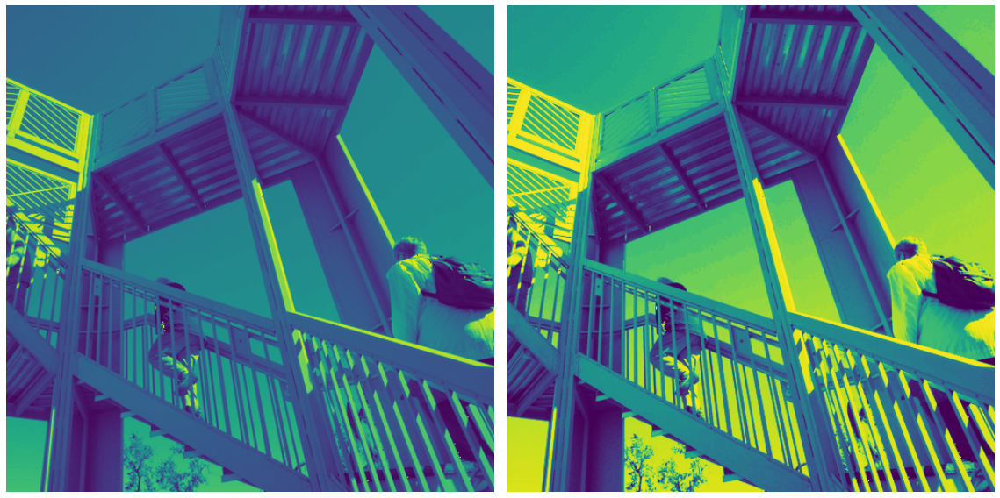

In [149]:
from skimage import exposure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), **noframe)
ax1.imshow(ascent)
ax2.imshow(exposure.equalize_hist(ascent))
fig.tight_layout()

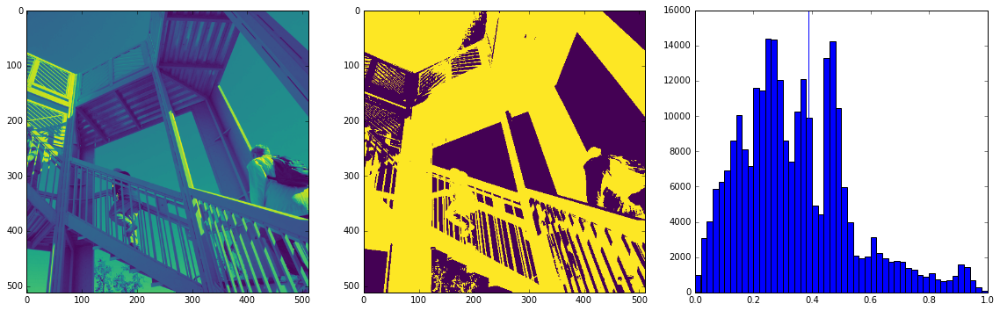

In [284]:
val = filters.threshold_otsu(ascent)
mask = ascent < val

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 5))
ax1.imshow(ascent)
ax2.imshow(mask)
ax3.hist(ascent.ravel(), bins=plt.linspace(0, 1, 51))
ax3.axvline(val)
fig.tight_layout()

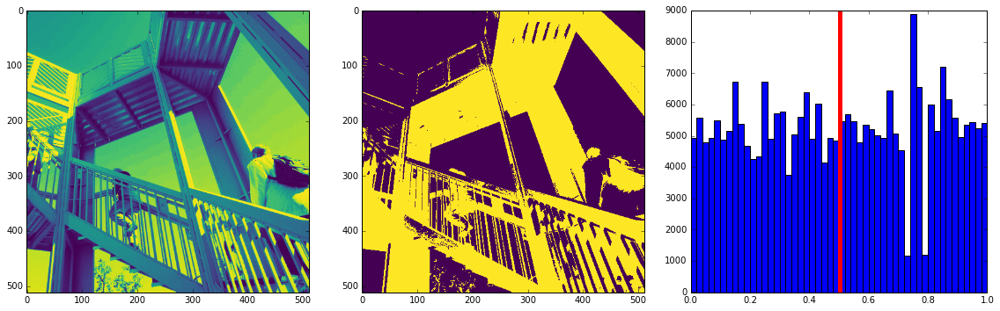

In [375]:
ascent_ = exposure.equalize_hist(ascent)
val = filters.threshold_otsu(ascent_)
mask = ascent_ < val

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 5))
ax1.imshow(ascent_)
ax2.imshow(mask)
ax3.hist(ascent_.ravel(), bins=plt.linspace(0, 1, 51))
ax3.axvline(val, color='r', linewidth=5)
fig.tight_layout()

In [135]:
from skimage import morphology
morphology.diamond(2)

array([[0, 0, 1, 0, 0],
       [0, 1, 1, 1, 0],
       [1, 1, 1, 1, 1],
       [0, 1, 1, 1, 0],
       [0, 0, 1, 0, 0]], dtype=uint8)

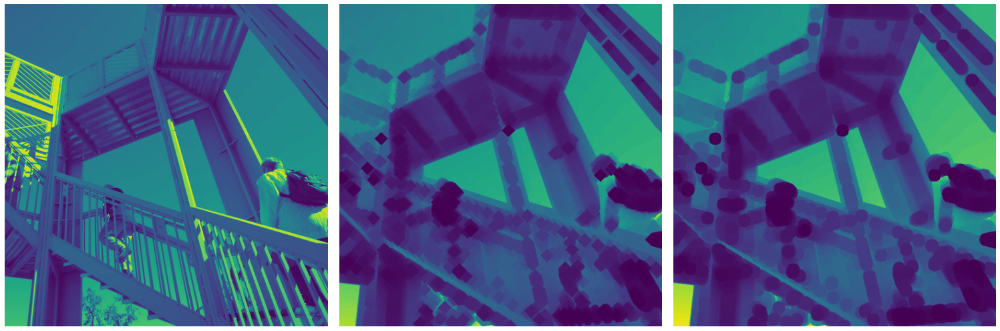

In [148]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(21, 7), **noframe)
ax1.imshow(ascent)
ax2.imshow(morphology.erosion(ascent, morphology.diamond(10)))
ax3.imshow(morphology.erosion(ascent, morphology.disk(10)))
fig.tight_layout()

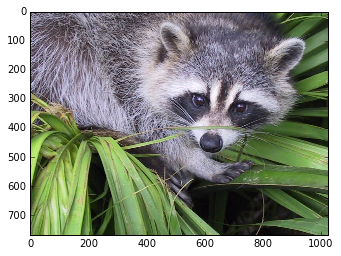

In [94]:
import skimage.color as skcolor
hsv_face = skcolor.rgb2hsv(face)
# luminosity, reg/green, yellow/blue
lab_face = skcolor.rgb2lab(face)
rgb_face = skcolor.hsv2rgb(hsv_face)
plt.imshow(rgb_face)

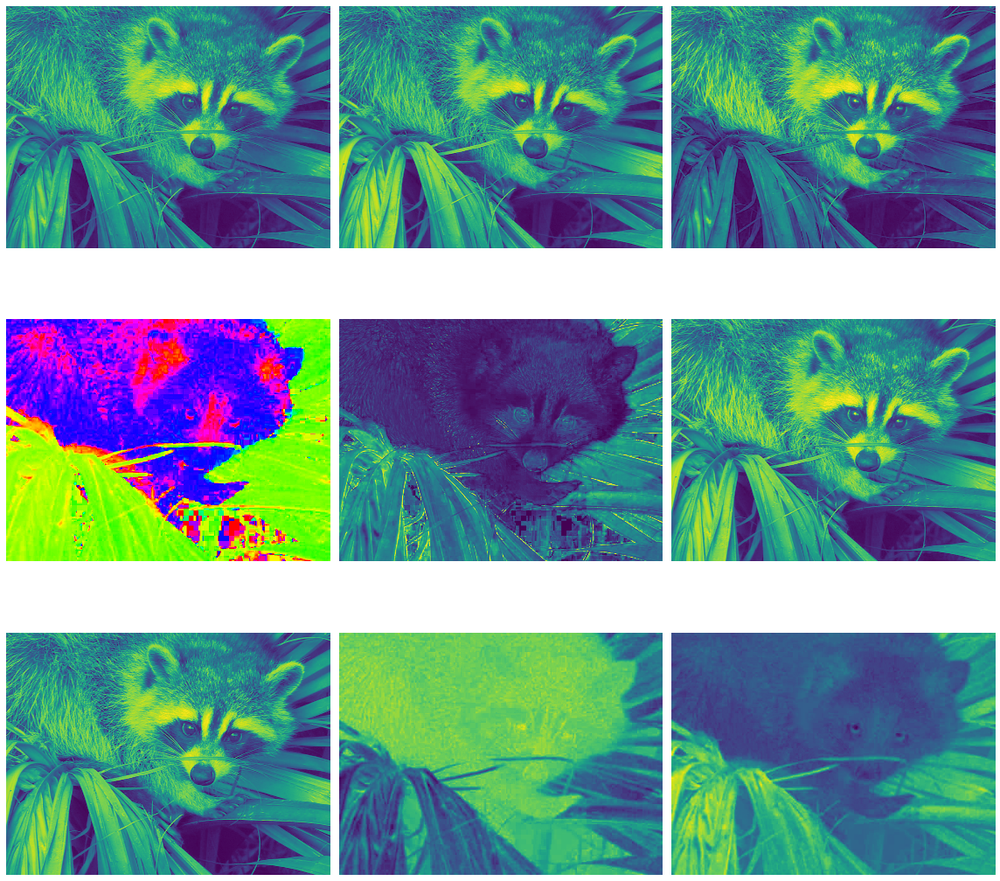

In [303]:
fig, ax = plt.subplots(3, 3, figsize=(16, 16), **noframe)
ax[0, 0].imshow(face[:, :, 0])
ax[0, 1].imshow(face[:, :, 1])
ax[0, 2].imshow(face[:, :, 2])
ax[1, 0].imshow(hsv_face[:, :, 0], cmap='hsv')
ax[1, 1].imshow(hsv_face[:, :, 1])
ax[1, 2].imshow(hsv_face[:, :, 2])
ax[2, 0].imshow(lab_face[:, :, 0])
ax[2, 1].imshow(lab_face[:, :, 1])
ax[2, 2].imshow(lab_face[:, :, 2])
fig.tight_layout()

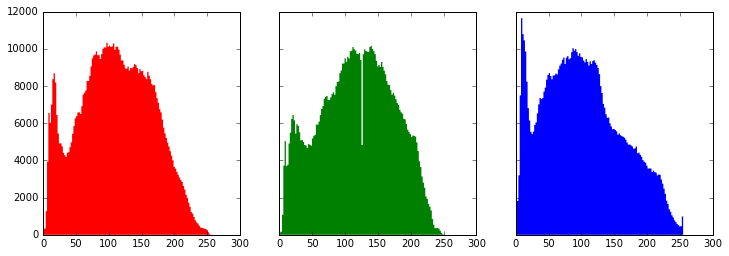

In [82]:
fig, (axr, axg, axb) = plt.subplots(1, 3, figsize=(12, 4), sharey=True, sharex=True)
axr.hist(face[:, :, 0].ravel(), bins=127, histtype='stepfilled', facecolor='r', edgecolor='none')
axg.hist(face[:, :, 1].ravel(), bins=127, histtype='stepfilled', facecolor='g', edgecolor='none')
axb.hist(face[:, :, 2].ravel(), bins=127, histtype='stepfilled', facecolor='b', edgecolor='none')
None

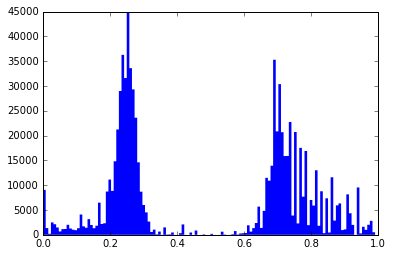

In [83]:
_, bins, patches = plt.hist(hsv_face[:, :, 0].ravel(), bins=127, histtype='stepfilled', edgecolor='none')

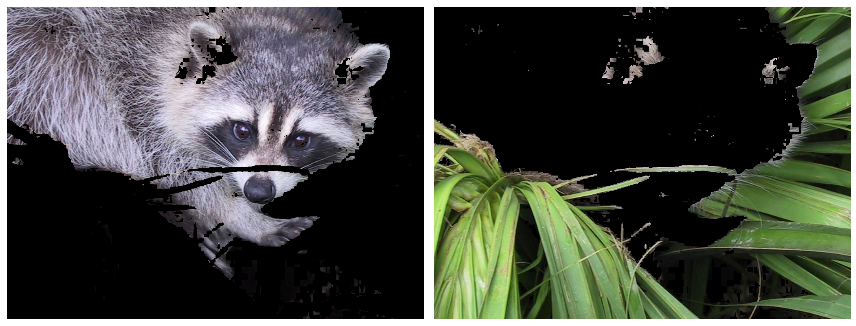

In [129]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), **noframe)
ax1.imshow(face * (hsv_face[:, :, 0]>0.5)[:,:, np.newaxis])
ax2.imshow(face * (hsv_face[:, :, 0]<0.5)[:,:, np.newaxis])
fig.tight_layout()

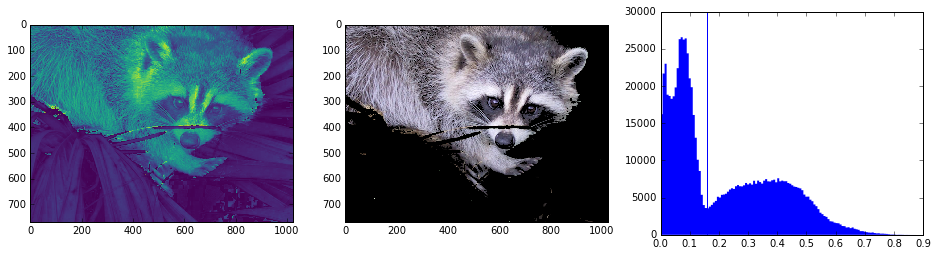

In [319]:
mask = ((hsv_face[:, :, 0]-0.1)%1)*hsv_face[:, :, 2]

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 4))
ax1.imshow(mask)
ax2.imshow(np.where(mask[:,:,np.newaxis]>0.16, face, 0))
ax3.hist(mask.ravel(), bins=127, histtype='stepfilled', edgecolor='none')
ax3.axvline(0.16)

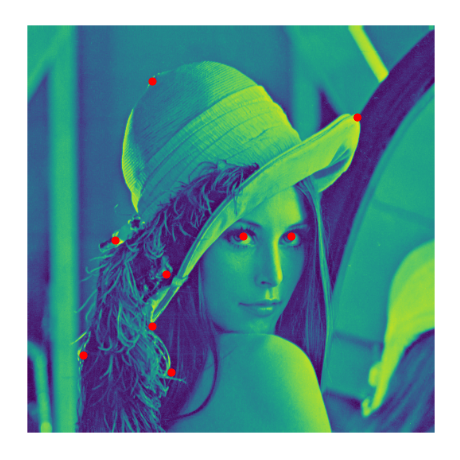

In [361]:
from skimage.feature import corner_harris,corner_peaks
from skimage.color import rgb2gray

image = rgb2gray(lena)
image_corners = corner_peaks(corner_harris(image),min_distance=55)

fig, ax = plt.subplots(1, 1, figsize=(8, 8), **noframe)
ax.imshow(image)
y_corner, x_corner = zip(*image_corners)
ax.scatter(x_corner, y_corner, color='r', s=50)

In [ ]:
from skimage import data
from skimage.viewer import plugins
from skimage import viewer
coins = data.coins()
new_viewer = viewer.ImageViewer(coins) 
new_viewer += plugins.lineprofile.LineProfile() 
new_viewer.show() 

Line profile tool
+ and - keys or mouse scroll changes width of scan line.
Select and drag ends of the scan line to adjust it.


# wavelet analysis

Wavelet Packet nodes are arranged in a tree. Each node in a WP tree is uniquely identified and addressed by a path string.

In the 1D WaveletPacket case nodes were accessed using 'a' (approximation) and 'd' (details) path names (each node has two 1D children).

Because now we deal with a bit more complex structure (each node has four children), we have four basic path names based on the dwt 2D output convention to address the WP2D structure:

        a - LL, low-low coefficients
        h - LH, low-high coefficients
        v - HL, high-low coefficients
        d - HH, high-high coefficients

In other words, subnode naming corresponds to the dwt2() function output naming convention (as wavelet packet transform is based on the dwt2 transform):

In [110]:
import pywt

In [111]:
wp = pywt.WaveletPacket2D(data=ascent, wavelet='db1', mode='symmetric')
print(wp.maxlevel)

9


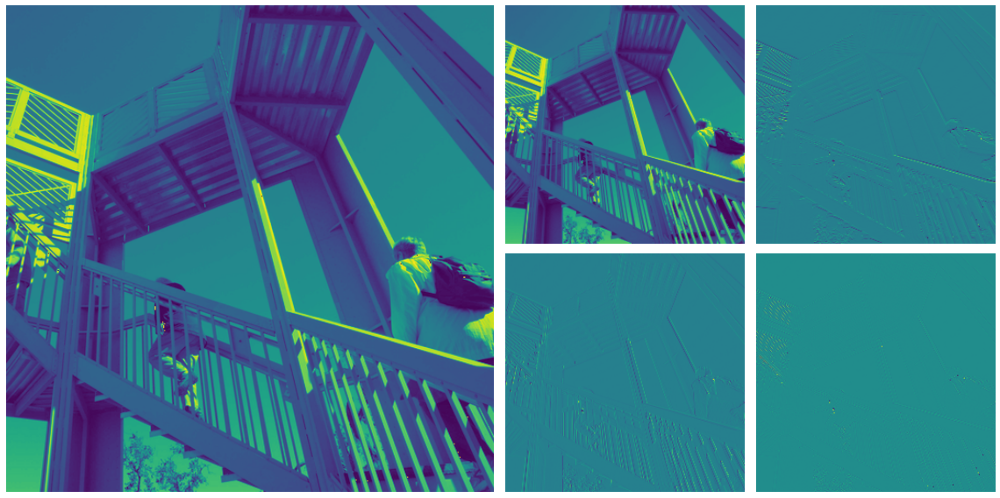

In [112]:
fig = plt.figure(figsize=(16, 8))
clear = dict(frame_on=False, xticks=[], yticks=[])

ax_main = plt.subplot2grid((2, 4), (0, 0), colspan=2, rowspan=2, **clear)
ax_main.imshow(wp.data)

ax_a = plt.subplot2grid((2, 4), (0, 2), **clear)
ax_a.imshow(wp['a'].data)

ax_h = plt.subplot2grid((2, 4), (0, 3), **clear)
ax_h.imshow(wp['h'].data)

ax_v = plt.subplot2grid((2, 4), (1, 2), **clear)
ax_v.imshow(wp['v'].data)

ax_d = plt.subplot2grid((2, 4), (1, 3), **clear)
ax_d.imshow(wp['d'].data)

fig.tight_layout()

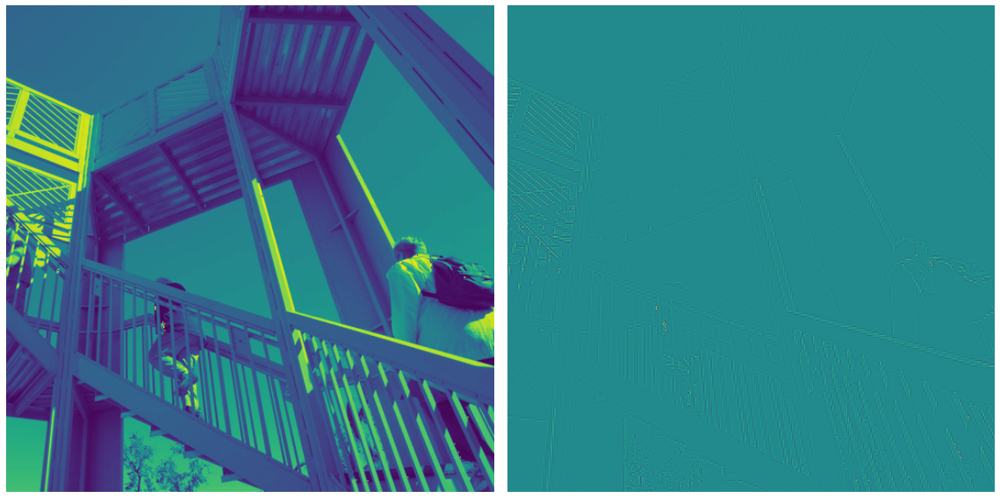

In [113]:
wp = pywt.WaveletPacket2D(data=ascent, wavelet='db1', mode='symmetric')
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), **noframe)
ax1.imshow(wp.data)
wp['a'] = np.zeros(wp['a'].data.shape)
#wp['d'] = np.zeros(wp['d'].data.shape)
#wp['h'] = np.zeros(wp['h'].data.shape)
#wp['v'] = np.zeros(wp['v'].data.shape)
d = wp.reconstruct(update=False)
ax2.imshow(d)
fig.tight_layout()

### possibili librerie alternative

Quelle mostrate sono solo una parte di quelle possibili:

* mahotas
* openCV
* Pillow
* ITK
* etc...

ma sono quelle più orientate al codice scientifico.

# http://www.scipy-lectures.org/advanced/image_processing/

In [290]:
from sklearn.feature_extraction import image
from sklearn.cluster import spectral_clustering

l = 100
x, y = np.indices((l, l))

center1 = (28, 24)
center2 = (40, 50)
center3 = (67, 58)
center4 = (24, 70)
radius1, radius2, radius3, radius4 = 16, 14, 15, 14

circle1 = (x - center1[0])**2 + (y - center1[1])**2 < radius1**2
circle2 = (x - center2[0])**2 + (y - center2[1])**2 < radius2**2
circle3 = (x - center3[0])**2 + (y - center3[1])**2 < radius3**2
circle4 = (x - center4[0])**2 + (y - center4[1])**2 < radius4**2

# 4 circles
img = circle1 + circle2 + circle3 + circle4
mask = img.astype(bool)
img = img.astype(float)

img += 1 + 0.2*np.random.randn(*img.shape)
# Convert the image into a graph with the value of the gradient on
# the edges.

In [297]:
graph = image.img_to_graph(img, mask=mask)

# Take a decreasing function of the gradient: we take it weakly
# dependant from the gradient the segmentation is close to a voronoi
graph.data = np.exp(-graph.data/graph.data.std())

labels = spectral_clustering(graph, n_clusters=4, eigen_solver='arpack')
label_im = -np.ones(mask.shape)
label_im[mask] = labels

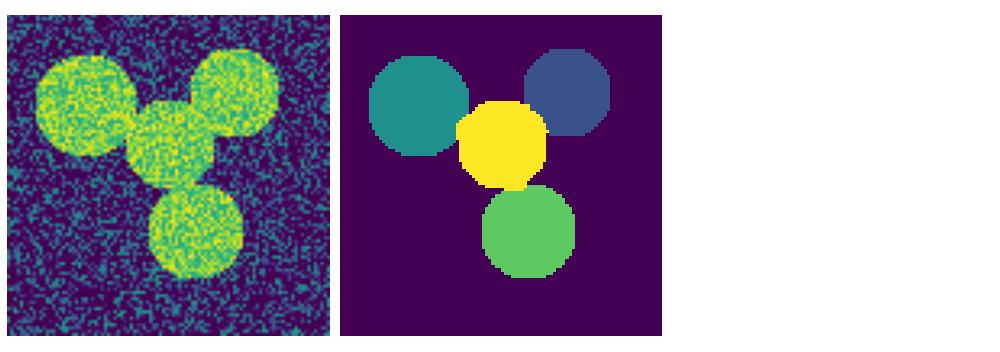

In [301]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(14, 5), **noframe)
ax1.imshow(img)
ax2.imshow(label_im, interpolation='nearest');
fig.tight_layout()